# Part I - American Stocks index Exploratory Analysis
## by Jorge Muñoz Rama

## Table of contents
<ul>
<li><a href="#introduction">Introduction</a></li>
<li><a href="#gather">Gather</a></li>
<li><a href="#assess">Assess and explore data</a></li>
<li><a href="#clean">Clean data</a></li>  
<li><a href="#analysis">Analysis and Visualization</a></li>
    <ul>
    <li><a href="#SPY plot">SPY Adjested Close Prices plot</a></li>
    <li><a href="#breaks per yea">Number fo maximum historical prices per yea</a></li>
    <li><a href="#all series">Plot all series of 250 days after new high</a></li>
    </ul>
<li><a href="#conclusion">Conclusion</a></li>
</ul>

## Intoduction
This study intends to explore and study one of the main American indexes Standard & Poor's 500 index (SPY)  from the perspective of the breaks of their maximum historical prices over time and see what impact or how a simple strategy of buying every time a price occurs new all-time high and hold the position for one year.  

We will see how many breakouts occurred over time and what returns this simple strategy would give in the past.
This study is not a backtest, it is simply a statistical study to see if there are any indications that the strategy might work.  

We are going to take all the historical prices of the indices from the first day of listing until December 4, 2022.  

We are going to make several simplifications that do not exactly correspond to a real situation when we operate in the market. One of them is that we will assume that we buy the day of the maximum break at the price of adjusted close prices. This is unrealistic since the idea would be to buy with a buy stop order placing its value one cent above the most recent historical maximum price and with this strategy the order could enter when the market opens with a buy gap (open price ) or during that day.
We are not considering any commission for operating in the market, nor placing stop losses to try to limit the loss or using the concept of position size.

In [1]:
# import  packages 
import numpy as np
import pandas as pd
import datetime as datetime
import matplotlib.pyplot as plt
import seaborn as sb
import time

%matplotlib inline

# suppress warnings from final output
import warnings
warnings.simplefilter("ignore")
import yfinance as yf

### Gather the data

In [2]:
# Download the data of the stock or index
def data_ticker(ticker):
    ticker = ticker
    data = yf.download(ticker, period="max") 
    return data, ticker

In [3]:
# Get the data for SPY
data, ticker = data_ticker('SPY')

[*********************100%***********************]  1 of 1 completed


## Assess and explore data

In [4]:
data.head()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
1993-01-29,43.96875,43.96875,43.75000,43.93750,25.334021,1003200
1993-02-01,43.96875,44.25000,43.96875,44.25000,25.514200,480500
1993-02-02,44.21875,44.37500,44.12500,44.34375,25.568258,201300
1993-02-03,44.40625,44.84375,44.37500,44.81250,25.838535,529400
1993-02-04,44.96875,45.09375,44.46875,45.00000,25.946661,531500


### Let's see the columns information

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 7518 entries, 1993-01-29 to 2022-12-05
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Open       7518 non-null   float64
 1   High       7518 non-null   float64
 2   Low        7518 non-null   float64
 3   Close      7518 non-null   float64
 4   Adj Close  7518 non-null   float64
 5   Volume     7518 non-null   int64  
dtypes: float64(5), int64(1)
memory usage: 411.1 KB


There are not NaN's

In [6]:
data.describe()

,Open,High,Low,Close,Adj Close,Volume
count,7518.000000,7518.000000,7518.000000,7518.000000,7518.000000,7.518000e+03
mean,161.393304,162.369924,160.310259,161.395409,134.746416,8.455784e+07
std,96.815794,97.347540,96.229613,96.828542,102.998613,9.387982e+07
min,43.343750,43.531250,42.812500,43.406250,25.027718,5.200000e+03
25%,103.420002,104.320000,102.697500,103.480000,71.120592,9.060500e+06
50%,130.229996,131.129997,129.459999,130.372498,93.942108,6.136995e+07
75%,204.612499,205.912498,203.877502,204.847504,179.069160,1.184470e+08
max,479.220001,479.980011,476.059998,477.709991,472.242310,8.710263e+08


### Let's make a plot with the SPY historical Adjuste prices (log scale)

In [7]:
import plotly.express as px
fig = px.line(data, x=data.index, y="Adj Close",  log_y=True,
             title= ticker + ' Historical Prices')
fig.show()

## Store the data

In [8]:
data.to_csv('SPY_clean_data.csv', index=False)

## Analysis and Visualization

### Let's get the new maximun hights 
The max_high change each time that the price is greater than day before.

In [14]:
data['max_high'] =data['High'].cummax()
data.head(10)

,Open,High,Low,Close,Adj Close,Volume,max_high
Date,,,,,,,
1993-01-29,43.96875,43.96875,43.75000,43.93750,25.334028,1003200,43.96875
1993-02-01,43.96875,44.25000,43.96875,44.25000,25.514217,480500,44.25000
1993-02-02,44.21875,44.37500,44.12500,44.34375,25.568272,201300,44.37500
1993-02-03,44.40625,44.84375,44.37500,44.81250,25.838552,529400,44.84375
1993-02-04,44.96875,45.09375,44.46875,45.00000,25.946644,531500,45.09375
1993-02-05,44.96875,45.06250,44.71875,44.96875,25.928637,492100,45.09375
1993-02-08,44.96875,45.12500,44.90625,44.96875,25.928637,596100,45.12500
1993-02-09,44.81250,44.81250,44.56250,44.65625,25.748453,122100,45.12500
1993-02-10,44.65625,44.75000,44.53125,44.71875,25.784489,379600,45.12500


### We are going to create other variable max_high_lag
Where each value is equal to the max_hig before

In [15]:
data['max_high_lag'] = data['max_high'].transform('shift')
data.head(10)

,Open,High,Low,Close,Adj Close,Volume,max_high,max_high_lag
Date,,,,,,,,
1993-01-29,43.96875,43.96875,43.75000,43.93750,25.334028,1003200,43.96875,NaN
1993-02-01,43.96875,44.25000,43.96875,44.25000,25.514217,480500,44.25000,43.96875
1993-02-02,44.21875,44.37500,44.12500,44.34375,25.568272,201300,44.37500,44.25000
1993-02-03,44.40625,44.84375,44.37500,44.81250,25.838552,529400,44.84375,44.37500
1993-02-04,44.96875,45.09375,44.46875,45.00000,25.946644,531500,45.09375,44.84375
1993-02-05,44.96875,45.06250,44.71875,44.96875,25.928637,492100,45.09375,45.09375
1993-02-08,44.96875,45.12500,44.90625,44.96875,25.928637,596100,45.12500,45.09375
1993-02-09,44.81250,44.81250,44.56250,44.65625,25.748453,122100,45.12500,45.12500
1993-02-10,44.65625,44.75000,44.53125,44.71875,25.784489,379600,45.12500,45.12500


### Create a new column (order)
When the stock reach a new maximun we buy (1) in other case is cero (0)

In [16]:
data['order'] = np.where(data['max_high'] > data['max_high_lag'],1,0)
data.head(60)

,Open,High,Low,Close,Adj Close,Volume,max_high,max_high_lag,order
Date,,,,,,,,,
1993-01-29,43.96875,43.96875,43.75000,43.93750,25.334028,1003200,43.96875,NaN,0
1993-02-01,43.96875,44.25000,43.96875,44.25000,25.514217,480500,44.25000,43.96875,1
1993-02-02,44.21875,44.37500,44.12500,44.34375,25.568272,201300,44.37500,44.25000,1
1993-02-03,44.40625,44.84375,44.37500,44.81250,25.838552,529400,44.84375,44.37500,1
1993-02-04,44.96875,45.09375,44.46875,45.00000,25.946644,531500,45.09375,44.84375,1
1993-02-05,44.96875,45.06250,44.71875,44.96875,25.928637,492100,45.09375,45.09375,0
1993-02-08,44.96875,45.12500,44.90625,44.96875,25.928637,596100,45.12500,45.09375,1
1993-02-09,44.81250,44.81250,44.56250,44.65625,25.748453,122100,45.12500,45.12500,0
1993-02-10,44.65625,44.75000,44.53125,44.71875,25.784489,379600,45.12500,45.12500,0


### Let's see how many maximun historical price there are in the data

In [17]:
data.order.sum()

636

#### The SPY broke it's historical maximun price 636 times from 1993 until 2022.

In [18]:
#data['year'] =data.time.dt.year
data['year'] = data.index.to_frame().Date.dt.year

In [19]:
data.head(3)

,Open,High,Low,Close,Adj Close,Volume,max_high,max_high_lag,order,year
Date,,,,,,,,,,
1993-01-29,43.96875,43.96875,43.75000,43.93750,25.334028,1003200,43.96875,NaN,0,1993
1993-02-01,43.96875,44.25000,43.96875,44.25000,25.514217,480500,44.25000,43.96875,1,1993
1993-02-02,44.21875,44.37500,44.12500,44.34375,25.568272,201300,44.37500,44.25000,1,1993


### Let's see total breaks by year.

In [20]:
break_year =data.groupby('year').agg({'order': 'sum'}).reset_index().sort_values(by =['order', 
                                                                                      'year'] ,ascending = False)
break_year

,year,order
28,2021,79
2,1995,75
24,2017,59
5,1998,57
21,2014,55
20,2013,48
4,1997,42
3,1996,41
27,2020,37
6,1999,34


### Let's plot the breaks of maximum historical prices per year

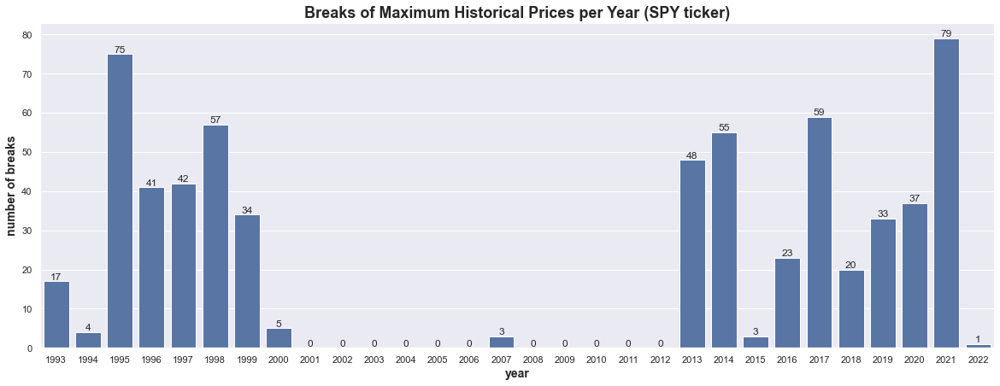

In [21]:
# 
# set a larger figure size for the plot
plt.figure(figsize = [20, 7]) 
sb.set_theme(style="darkgrid")

# Count plot in bar order
g=sb.barplot(data = break_year, x = 'year', palette=['#4c72b0'],   
               y = 'order')
            
g.bar_label(g.containers[0])
plt.xlabel('year', fontsize=14, weight='bold')
plt.ylabel('number of breaks', fontsize=14, weight='bold')
plt.title('Breaks of Maximum Historical Prices per Year (' +
          ticker + ' ticker' +')', fontsize=18, weight='bold');

We see the amount of times that SPy has broken it's maximun historical prices by year. The Spy have had two big rally from 1993 to 2000 and from 2013 to 2021. It seems that is a good simple strategy to buy the SPY when breaks the maximun historical price and hold for a while.

#### We are going to implement a simple strategy. Buy when the price break it's historical maximun and hold during a year. We are going to do that  636 times (when the SPY broke it's maximun) and see What the return woul be.

In [22]:
data.index[0] #+ datetime.timedelta(days=10)

Timestamp('1993-01-29 00:00:00')

### Let's get the index where all the new prices high

In [23]:
index_buy = data[data['order']==1].index
index_buy

DatetimeIndex(['1993-02-01', '1993-02-02', '1993-02-03', '1993-02-04',
               '1993-02-08', '1993-03-03', '1993-03-04', '1993-03-08',
               '1993-03-11', '1993-08-18',
               ...
               '2021-11-02', '2021-11-03', '2021-11-04', '2021-11-05',
               '2021-11-19', '2021-11-22', '2021-12-27', '2021-12-28',
               '2021-12-30', '2022-01-04'],
              dtype='datetime64[ns]', name='Date', length=636, freq=None)

In [24]:
# Reset the index of the data
data_reset = data.reset_index()
data_reset.head(2)

,Date,Open,High,Low,Close,Adj Close,Volume,max_high,max_high_lag,order,year
0,1993-01-29,43.96875,43.96875,43.75000,43.9375,25.334028,1003200,43.96875,NaN,0,1993
1,1993-02-01,43.96875,44.25000,43.96875,44.2500,25.514217,480500,44.25000,43.96875,1,1993


In [25]:
# Function to normalize the prices base on 1 (starting in 1)
def normalize_price(price):
    """
    This function take column price (ADj Price or other)
    and return the price in base one ( the first value is one)
    so we are going to see the up or down of prices as returns
    values.
    """
    normalize = data_breaks[price][0]
    data_breaks['normalize'] = data_breaks[price].apply(lambda x: x/normalize)
    return data_breaks

### Let's create a dataset with a series of values starting with the first day where the price hits a new all-time high and adding 250 days to the series and we'll do this for all the days on which a new all-time high occurs.

In [26]:
# Create datasets from the first day of the break until 250 days.
data_250 = pd.DataFrame()
for index in range(0, data.order.sum()):
    data_breaks = data_reset[data_reset['Date'] >= index_buy[index]][0:250].reset_index()
    # Create a column with the numebr of the break
    data_breaks['break_max'] = index +1
    # call the function to normalize the adjuste close
    normalize_price('Adj Close')
    # Append the datasets
    data_250= pd.concat([data_250, data_breaks], axis=0)
    
   

In [27]:
# The dataset with al 250 days after breaks
data_250

,index,Date,Open,High,Low,Close,Adj Close,Volume,max_high,max_high_lag,order,year,break_max,normalize
0,1,1993-02-01,43.968750,44.250000,43.968750,44.250000,25.514217,480500,44.250000,43.968750,1,1993,1,1.000000
1,2,1993-02-02,44.218750,44.375000,44.125000,44.343750,25.568272,201300,44.375000,44.250000,1,1993,1,1.002119
2,3,1993-02-03,44.406250,44.843750,44.375000,44.812500,25.838552,529400,44.843750,44.375000,1,1993,1,1.012712
3,4,1993-02-04,44.968750,45.093750,44.468750,45.000000,25.946644,531500,45.093750,44.843750,1,1993,1,1.016948
4,5,1993-02-05,44.968750,45.062500,44.718750,44.968750,25.928637,492100,45.093750,45.093750,0,1993,1,1.016243
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
226,7512,2022-11-28,399.089996,400.809998,395.109985,395.910004,395.910004,67881600,479.980011,479.980011,0,2022,636,0.838643
227,7513,2022-11-29,396.049988,397.299988,393.299988,395.230011,395.230011,52310000,479.980011,479.980011,0,2022,636,0.837202
228,7514,2022-11-30,395.489990,407.679993,393.480011,407.679993,407.679993,144566700,479.980011,479.980011,0,2022,636,0.863575
229,7515,2022-12-01,408.769989,410.000000,404.750000,407.380005,407.380005,76398200,479.980011,479.980011,0,2022,636,0.862939


Now we have a data set with 158,938 rows grouped by the number at which the new high occurs and 250 days from here

### Let's get a table with all return after a year

In [28]:
# Get the table with the return of each break
returns = data_250.groupby(['break_max']).agg({'normalize': 'last'}).reset_index()
returns

,break_max,normalize
0,1,1.093169
1,2,1.093748
2,3,1.092315
3,4,1.090612
4,5,1.093506
...,...,...
631,632,0.855927
632,633,0.862468
633,634,0.863173
634,635,0.864460


In [29]:
returns.describe()

,break_max,normalize
count,636.000000,636.000000
mean,318.500000,1.141470
std,183.741666,0.126316
min,1.000000,0.657054
25%,159.750000,1.068912
50%,318.500000,1.162226
75%,477.250000,1.226205
max,636.000000,1.405452


#### We se that the mean of all returns is 14,15 %. The maximun return in one serie is 40.55% and the maximun loss is 34,29%.

### Let's get all posite returns

In [30]:
returns[returns['normalize'] > 1]

,break_max,normalize
0,1,1.093169
1,2,1.093748
2,3,1.092315
3,4,1.090612
4,5,1.093506
...,...,...
581,582,1.068181
582,583,1.081961
583,584,1.034132
584,585,1.033540


#### We would win 551 times

In [31]:
# Get all the values with the price less than 1 (negative return)
returns[returns['normalize']< 1]

,break_max,normalize
17,18,0.992317
20,21,0.999083
265,266,0.938595
266,267,0.915555
267,268,0.898153
...,...,...
631,632,0.855927
632,633,0.862468
633,634,0.863173
634,635,0.864460


With this strategy we would lose 85 times

In [32]:
# Simple resume statistis for all the losses
returns[returns['normalize']< 1].describe()

,break_max,normalize
count,85.000000,85.000000
mean,508.752941,0.905960
std,147.744221,0.068720
min,18.000000,0.657054
25%,468.000000,0.864460
50%,594.000000,0.920700
75%,615.000000,0.949948
max,636.000000,0.999383


#### The mean of trading losses is 9.46

### Let's get the table where the return is positve after the break and 250 market days.

In [33]:
returns[returns['normalize']> 1]

,break_max,normalize
0,1,1.093169
1,2,1.093748
2,3,1.092315
3,4,1.090612
4,5,1.093506
...,...,...
581,582,1.068181
582,583,1.081961
583,584,1.034132
584,585,1.033540


#### We would have won 551 times

In [34]:
551/(85+ 551)

0.8663522012578616

#### The percentage of winning trades is 86.6% ( amazing)

In [35]:
returns[returns['normalize']> 1].describe()

,break_max,normalize
count,551.000000,551.000000
mean,289.150635,1.177800
std,170.844717,0.088354
min,1.000000,1.001186
25%,140.500000,1.123126
50%,291.000000,1.173151
75%,432.500000,1.240600
max,588.000000,1.405452


#### We see that the serie with the higher return was 40.54% and the lowest positive one is 0.11%

### The mean of of winning trades.

#### The mean of the win average is 17.78%

### Plot all the  250 market days series after reach a new maximun high price (635 plots)
We are going to make 635 plots from the new maximun high until 250 market days.

In [98]:
tickers = data_250.break_max.unique()
tickers = list(tickers)
tickers = map(str, tickers)
tickers = list(tickers)
tickers[0:4]

['1', '2', '3', '4']

In [64]:
df =data_250[['Date', 'break_max', 'Adj Close']]
df = df.set_index('Date')
df['break_max'] = df['break_max'].astype("string")
df.head()

,break_max,Adj Close
Date,,
1993-02-01,1,25.514217
1993-02-02,1,25.568272
1993-02-03,1,25.838552
1993-02-04,1,25.946644
1993-02-05,1,25.928637


3521.4055252075195


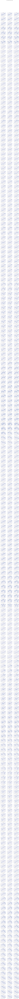

In [99]:
plt.figure(figsize=(15, 800))
#plt.subplots_adjust( hspace=0.5)
plt.suptitle("Daily closing prices", fontsize=18, y=0.95)
plt.subplots_adjust(top = 0.99, bottom=0.01, hspace=0.5, wspace=0.4)

# set number of columns (use 3)
ncols = 3
# calculate number of rows
nrows = len(tickers) // ncols + (len(tickers) % ncols > 0)

# loop through the length of tickers and keep track of index
for n, ticker in enumerate(tickers):
    # add a new subplot iteratively using nrows and cols
    ax = plt.subplot(nrows, ncols, n + 1)
    

    # filter df and plot ticker on the new subplot axis
    df[df["break_max"] == ticker].plot(ax=ax)
    plt.suptitle('Main title')

    # chart formatting
    #ax.set_title(ticker.upper())
    plt.suptitle('Series of 250 Market Days After a New High', y=1, fontweight = 'bold')
    ax.set_title('New High' + ticker)
    ax.get_legend().remove()
    ax.set_xlabel("")
    
end_time = time.time() - begin_time
print(end_time)


## Conclusion